# Trabajo Práctico de Estructuras de Datos

### Título: Implementación de un Crawler y Análisis de Grafos en `untref.edu.ar`

#### Nombre del Grupo: "Hoy no se fia, mañana si"

#### Integrantes del Grupo:
- Rodrigo Joaquin Frey <[freyrodry@gmail.com](mailto:nombre1@untref.edu.ar)>
- Facundo Mariscal <[facumariscal02@gmail.com](mailto:nombre2@untref.edu.ar)>
- Matias Fabian Varela <[nombre3@untref.edu.ar](mailto:nombre3@untref.edu.ar)>


## Introducción
A lo largo de este trabajo práctico, aplicamos conceptos de recuperación de información de la web, manejo de grafos y persistencia de datos. Implementamos un crawler para recolectar enlaces dentro del dominio "untref.edu.ar", que posteriormente convertimos en un grafo para realizar análisis avanzados, como el cálculo del PageRank y la identificación de componentes fuertemente conexas.

## Implementación del Crawler

### Funcionalidad Básica

El crawler está implementado en el archivo web_crawler.ipynb. La clase principal es WebCrawler, cuyo constructor toma como parámetros la URL de inicio, el nombre del archivo de salida (enlaces.csv) y un tiempo de espera entre solicitudes para evitar sobrecargar el servidor.

Clase WebCrawler: Implementa los métodos necesarios para rastrear enlaces de manera eficiente, teniendo en cuenta las restricciones del archivo robots.txt, así como el filtrado de URLs no deseadas.

Métodos importantes:

- **cargar_robots_txt()**: Carga y analiza el archivo robots.txt para verificar las reglas de rastreo del dominio untref.edu.ar.

- **es_rastreable(url)**: Verifica si una URL puede ser rastreada, usando el archivo robots.txt.

- **es_dominio_edu_ar(url)**: Confirma si una URL pertenece al dominio untref.edu.ar.

- **es_url_valida(url)**: Filtra enlaces que no apuntan a páginas web (por ejemplo, archivos .pdf, .jpg, y URLs de descarga).

- **crawl(url)**: Realiza el rastreo de las páginas a partir de la URL base. Utiliza una pila para manejar las URLs y asegurar que no se visiten duplicados.

- **guardar_en_csv()**: Almacena en un archivo CSV los enlaces descubiertos con su URL de origen, destino y el texto del enlace.

- **iniciar()**: Punto de entrada para iniciar el proceso de rastreo, invocando crawl y guardar_en_csv.

### Manejo de Excepciones y Robutez

Se manejan varias situaciones de error para mejorar la robustez del crawler:

- **Errores de red**: El código utiliza excepciones para manejar errores de conexión, como requests.RequestException, y evita interrumpir el proceso en caso de fallos de red.

- **Errores de parseo HTML**: La función fromstring de lxml está rodeada de un bloque try-except para capturar y manejar ParserError, permitiendo continuar con el rastreo aunque alguna página específica no pueda ser parseada correctamente.

### Persistencia de Datos

Los enlaces recolectados se almacenan en un archivo CSV (enlaces.csv), que contiene las columnas: "URL Origen", "URL Destino", y "Texto del Enlace". Este archivo sirve como base para construir un grafo dirigido en el siguiente paso del proyecto.

### Ejemplo de Ejecución

Al final del archivo, se crea una instancia del crawler y se llama al método iniciar() para iniciar el rastreo desde la URL base http://untref.edu.ar.

En su última ejecución, el crawler completó el archivo enlaces.csv en aproximadamente 8 horas, logrando recolectar más de 17,000 enlaces con sus relaciones de origen y destino. Esto muestra la eficiencia del crawler en la recolección de datos y su robustez para manejar múltiples enlaces en un dominio extenso.

## Construcción del Grafo

### Visualización del Grafo
Para la visualizacion del grafo utilizamos la biblioteca "Graphviz", la cual nos permitio visualizar el grafo de una manera mucho mas comoda debido a sus distintos tipos de motores y opciones de personalizacion, utilizamos el engine "sfdp" que a nuestro parecer quedaba visualmente mejor. Por otro lado, algunos caracteres en las URL de los nodos no eran compatibles con Graphviz, causando errores al momento de querer visualizar el grafo. Para resolver esto, creamos una función llamada caracteres_especiales, que transforma estos caracteres, asegurando que cada URL sea compatible con Graphviz .

### Ejemplo de Grafo Construido

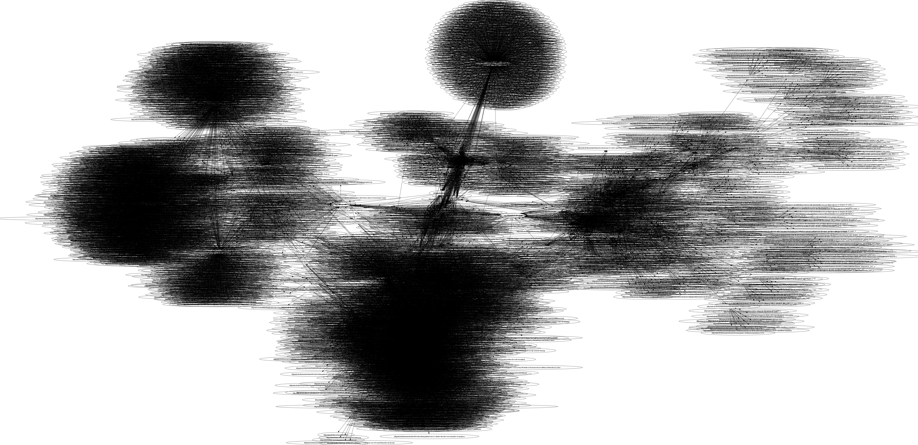

### Componentes Fuertemente Conexas
La función obtener_cfcs_tarjan utiliza el algoritmo de Tarjan para identificar todos los CFC en un gráfico dirigido. Este enfoque es eficiente, ya que utiliza una única pasada de DFS para encontrar todos los componentes, con una complejidad de tiempo de O(V + E) , donde V es el número de nodos y E es el número de aristas del grafo. La función es ideal para detectar componentes cíclicos y analizar dependencias en sistemas complejos.

### Visualización de las Componentes Fuertemente Conexas
Para la visualizacion de las CFC utilizamos la misma biblioteca "Graphviz", con el mismo motor "sfdp". Para diferenciar visualmente cada CFC en el gráfico, aplicamos distintos colores a cada una.

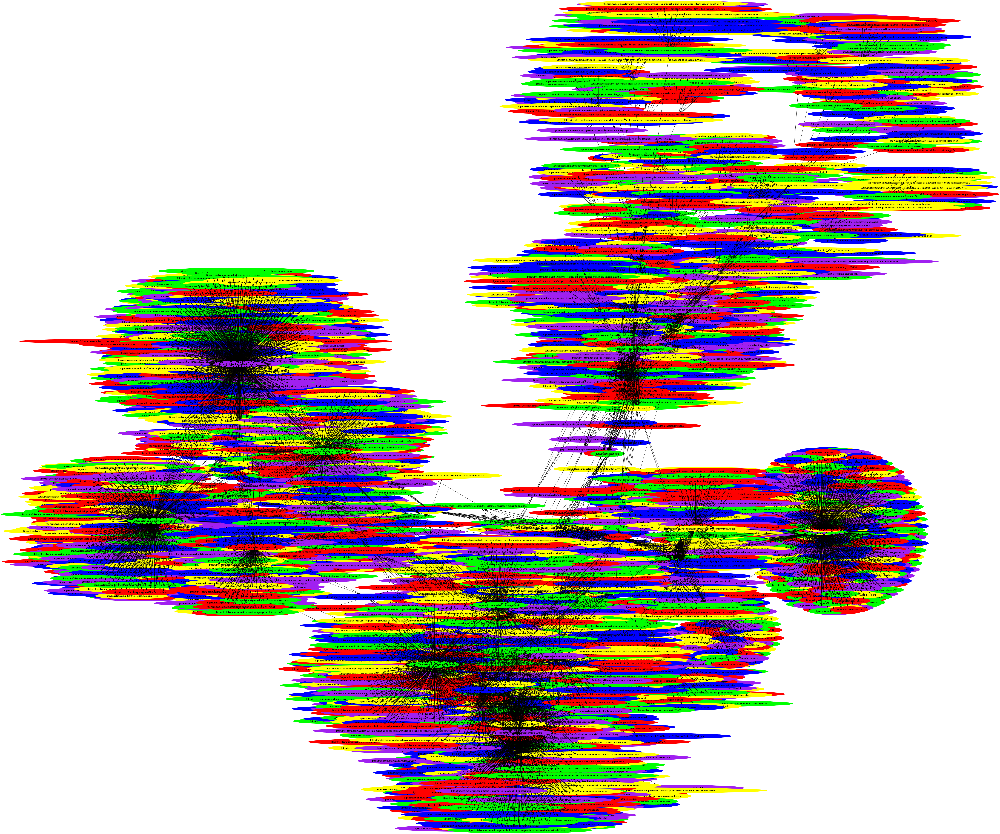

En este caso se puede observar que existen bastantes componentes fuertemente conexas.


## Cálculo del PageRank

```markdown
### Visualización del PageRank

A continuación se muestra una visualización del PageRank calculado para el grafo:

![pagerank_visualization.png](./pagerank_visualization.png)
```

### Implementación del Algoritmo

Para calcular el PageRank en este proyecto, implementamos el método calcular_pagerank dentro del archivo "pagerank.py". Este algoritmo sigue el modelo clásico de PageRank, utilizando un factor de amortiguación d=0.85, un número máximo de iteraciones de 100, y una tolerancia de 1e-6 para determinar la convergencia.

El proceso de cálculo consiste en:

1) Inicializar el valor de PageRank de cada nodo de manera uniforme.
2) Realizar iteraciones en las que cada nodo actualiza su PageRank en función de los nodos que apuntan hacia él y la cantidad de enlaces de salida de cada nodo.
3) Aplicar el "factor de pérdida" para aquellos nodos sin enlaces de salida, distribuyendo su PageRank de manera equitativa entre todos los nodos.

Cada iteración revisa la diferencia entre los valores de PageRank actualizados y los anteriores; si esta diferencia es menor que la tolerancia establecida, el algoritmo se detiene y se considera que ha convergido.

### Resultados del PageRank

Los resultados del cálculo del PageRank se almacenan en el archivo pagerank_resultados.csv. Este archivo contiene dos columnas:

- **URL**: Representa la página en el grafo.
- **PageRank**: El valor de PageRank calculado para esa URL, indicando su importancia relativa dentro del grafo.

Un resultado a destacar, y el cual consideramos mas importante, es el de la url principal "http://untref.edu.ar" que es de **0.00012913057123726827**.

## Visualisación de Resultados

Los siguientes gráficos son la representación de los resultados del PageRank, primero con los 10 mejores y luego en su totalidad

- **Top 10 del PageRank**:

![pagerank_top10.jpg](./pagerank_top10.jpg)

- **Visualización Completa del PageRank**:

![pagerank_visualization.jpg](./pagerank_visualization.jpg)
```

### Ejemplo de Ejecución del Cálculo

La ejecución del cálculo de PageRank se realiza en "grafo_web.ipynb". 
En la primera celda, se carga el grafo desde el archivo enlaces.csv y se configura con un límite de 16,000 aristas. 
Luego, se llama a la función *guardar_pagerank_csv(grafo, "pagerank_resultados.csv")* para calcular y almacenar los valores de PageRank en el archivo correspondiente.

## Conclusiones

En conclusión, la implementación del crawler sobre el sitio "untref.edu.ar" permitió la recolección de una gran cantidad de enlaces, generando así un grafo de alta densidad, compuesto por miles de nodos y aristas. Este grafo capturó una estructura detallada de la conectividad interna del sitio web, permitiéndonos realizar análisis avanzados.

El cálculo de PageRank nos proporcionó una medida cuantitativa de la importancia relativa de cada página dentro del grafo. Esto facilita la identificación de las páginas más relevantes en el dominio, proporcionando una visión más clara de cómo están organizadas las secciones del sitio web.

Por otro lado, el análisis de las Componentes Fuertemente Conexas (SCC) confirmó la estructura esperada del grafo: existe una única componente fuertemente conexa que abarca todos los nodos. Esto refleja que todas las páginas están directa o indirectamente relacionadas, lo cual es coherente con la presencia de un "nodo raíz" (la URL principal de "untref.edu.ar") que actúa como el centro de conexión de todas las demás páginas.

La implementación de persistencia en los datos fue esencial para manejar eficazmente el grafo y sus propiedades. Se desarrollaron funciones para almacenar el grafo y los resultados de los cálculos en archivos CSV, lo que permite su consulta y análisis en etapas posteriores. Estas funciones no solo garantizan la integridad de los datos, sino que también manejan posibles excepciones, mejorando la robustez y la eficiencia del proceso.


### Futuras Mejoras

Algunas ideas para posibles mejoras en el futuro son:

1) **Optimización del Crawler**: Mejorar la eficiencia del crawler para reducir el tiempo de ejecución. Esto podría incluir el posible uso de otras estructuras de datos, como las colas de prioridad, para priorizar ciertos enlaces o la implementación de un sistema de caché para evitar visitar URLs ya procesadas.
2) **Visualización Avanzada del Grafo**: Mejorar la visualización del grafo utilizando herramientas avanzadas o librerías de visualización interactiva. Esto permitiría explorar más fácilmente las conexiones y el flujo de tráfico dentro del sitio.
3) **Automatización del Proceso**: Crear scripts de automatización que permitan ejecutar el crawler, calcular el PageRank y analizar el grafo de manera más eficiente, facilitando el uso y mantenimiento del proyecto a largo plazo.

### Reflexiones Finales

En resumen, el trabajo práctico logró modelar de manera efectiva la estructura del sitio "untref.edu.ar", proporcionando herramientas valiosas para el análisis de la conectividad y relevancia de sus páginas. Este trabajo no solo permitió estudiar la organización interna del dominio, sino también identificar las páginas con mayor importancia mediante el cálculo de PageRank, así como comprender el sitio al analizar sus Componentes Fuertemente Conexas.

Además, el proyecto aplicó de manera práctica varios de los conceptos aprendidos en clase, incluyendo la persistencia de datos, la carga y guardado de información, y el manejo de excepciones para asegurar la integridad de los datos almacenados. Implementar estos mecanismos de persistencia en archivos CSV facilitó el análisis de datos a gran escala, permitiendo trabajar con un grafo complejo de manera eficiente.

En cuanto al desarrollo general del trabajo, como grupo enfrentamos ciertas dificultades, ya que, aunque estaba pensado para realizarse entre cinco integrantes, al ser menos, cada uno de nosotros terminó asumiendo una mayor carga de trabajo. Aun así, estamos satisfechos con el resultado final.

## Referencias

- [1] Documento de referencia 1
- [2] Documento de referencia 2
- [3] Biblioteca utilizada 1: `networkx`
- [4] Biblioteca utilizada 2: `matplotlib`